# Assignment 3 (Hotel Reservation)

* Possible points: 100

* Rename the .ipynb notebook as Assignment_3_{FirstName}_{LastName}.ipynb before submitting your notebook. Eg. Assignment_3_Vijay_Koju.ipynb

* Due Date: 05/01/2023 11:59pm

* Submit the .ipynb notebook only. There is no need to submit the data file and any other write up. All your code, and answers should be included in the notebook.

##### Include the following information:

* Name: Sai Pranay Reddy Aare
* UTD ID: sxa220072
* Email: sxa220072@utdallas.edu

## Context

A significant number of hotel bookings are called-off due to cancellations or no-shows. The typical reasons for cancellations include change of plans, scheduling conflicts, etc. This is often made easier by the option to do so free of charge or preferably at a low cost which is beneficial to hotel guests but it is a less desirable and possibly revenue-diminishing factor for hotels to deal with. Such losses are particularly high on last-minute cancellations. 

The new technologies involving online booking channels have dramatically changed customers’ booking possibilities and behavior. This adds a further dimension to the challenge of how hotels handle cancellations, which are no longer limited to traditional booking and guest characteristics. 

The cancellation of bookings impact a hotel on various fronts:
* Loss of resources (revenue) when the hotel cannot resell the room.
* Additional costs of distribution channels by increasing commissions or paying for publicity to help sell these rooms.
* Lowering prices last minute, so the hotel can resell a room, resulting in reducing the profit margin.
* Human resources to make arrangements for the guests.

## Data Description
The data contains different attributes of customers' booking details. The detailed data dictionary is given below.


**Data Dictionary**

* Booking_ID: unique identifier of each booking
* no_of_adults: Number of adults
* no_of_children: Number of Children
* no_of_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
* no_of_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
* type_of_meal_plan: Type of meal plan booked by the customer:
    * Not Selected – No meal plan selected
    * Meal Plan 1 – Breakfast
    * Meal Plan 2 – Half board (breakfast and one other meal)
    * Meal Plan 3 – Full board (breakfast, lunch, and dinner)
* required_car_parking_space: Does the customer require a car parking space? (0 - No, 1- Yes)
* room_type_reserved: Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
* lead_time: Number of days between the date of booking and the arrival date
* arrival_year: Year of arrival date
* arrival_month: Month of arrival date
* arrival_date: Date of the month
* market_segment_type: Market segment designation.
* repeated_guest: Is the customer a repeated guest? (0 - No, 1- Yes)
* no_of_previous_cancellations: Number of previous bookings that were canceled by the customer prior to the current booking
* no_of_previous_bookings_not_canceled: Number of previous bookings not canceled by the customer prior to the current booking
* avg_price_per_room: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
* no_of_special_requests: Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
* booking_status: Flag indicating if the booking was canceled or not. (This is the target column that we'd want to be able to predict). Use 'Canceled' as positive class and 'Not_Canceled' as negative class.

## Importing necessary libraries and data

In [179]:
import numpy as np
import pandas as pd

# To help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To split the data
from sklearn.model_selection import train_test_split

# To impute missing values
from sklearn.impute import SimpleImputer

# To build a Random forest classifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier

# To tune a model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# To get different performance metrics
import sklearn.metrics as metrics
from sklearn.metrics import (
    recall_score,
    accuracy_score,
    precision_score,
    f1_score,
    balanced_accuracy_score,
    roc_auc_score,
    roc_curve
)

# To suppress warnings
import warnings

warnings.filterwarnings("ignore")

In [180]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_sklearn(model, predictors, target, threshold=0.5):
    # predicting using the independent variables
    pred = model.predict_proba(predictors)[:,1] > threshold

    acc = accuracy_score(target, pred)  # to compute Accuracy
    b_acc = balanced_accuracy_score(target, pred) # balanced accuracy: average of recall obtained on each class
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score
    auc = roc_auc_score(target, model.predict_proba(predictors)[:,1])

    # creating a dataframe of metrics
    df_perf = pd.DataFrame({"Accuracy": acc, "Balanced Accuracy": b_acc,
                            "Recall": recall, "Precision": precision,
                            "F1": f1, "AUC": auc}, index=[0],)
    return df_perf

In [181]:
df = pd.read_csv("Hotel_reservation.csv")

## 1) Perform Exploratory Data Analysis (EDA) and state your observations. (10 points)

In [182]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

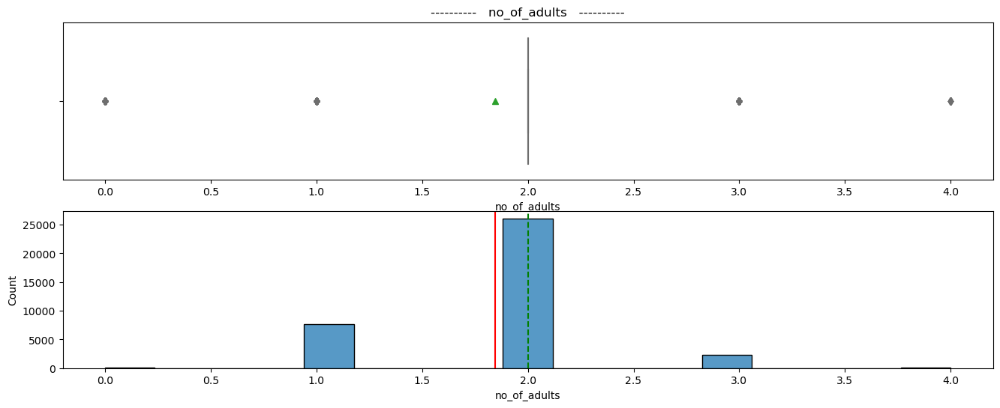

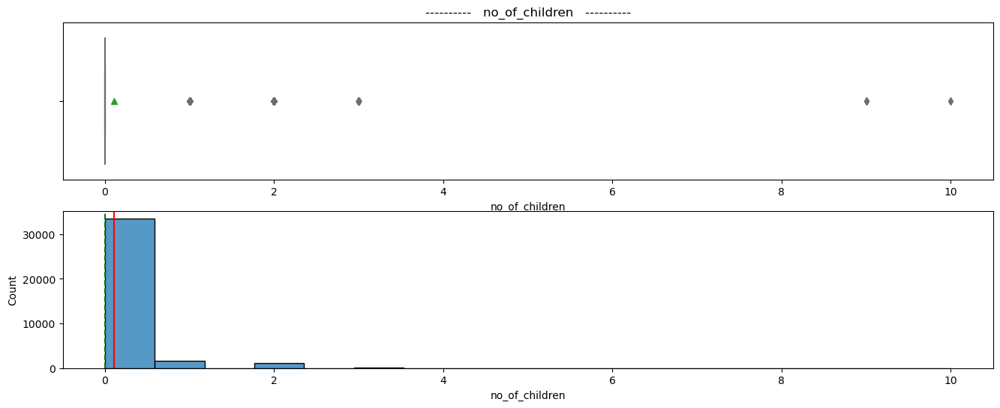

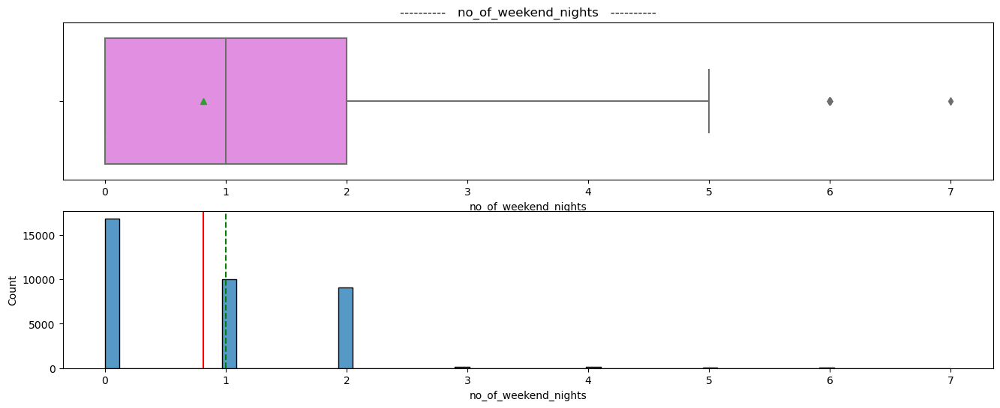

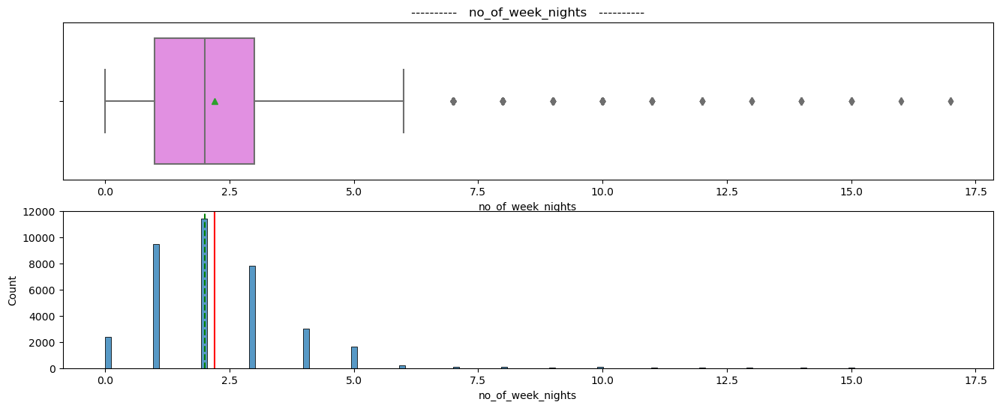

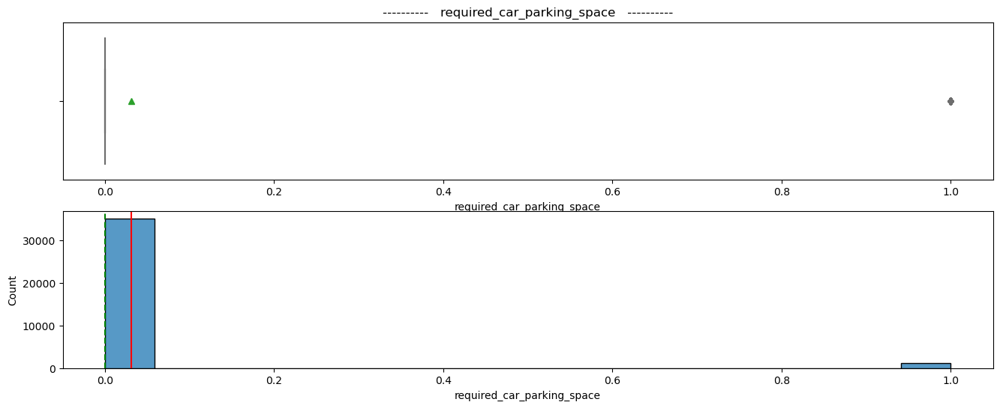

...

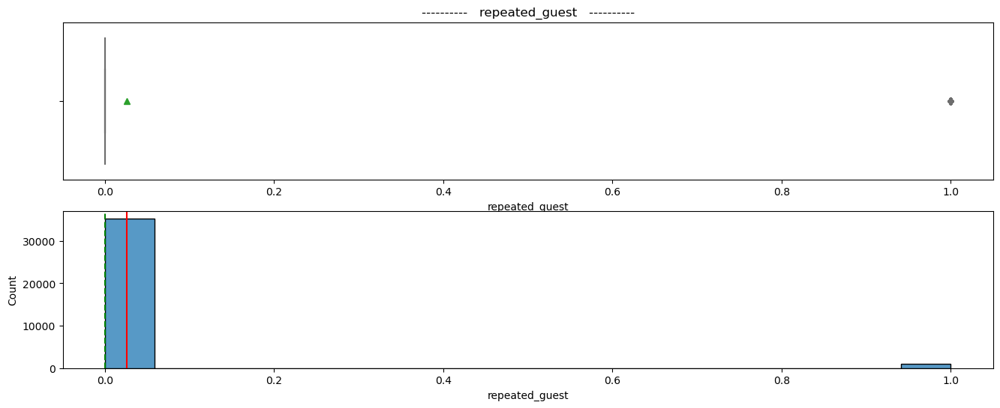

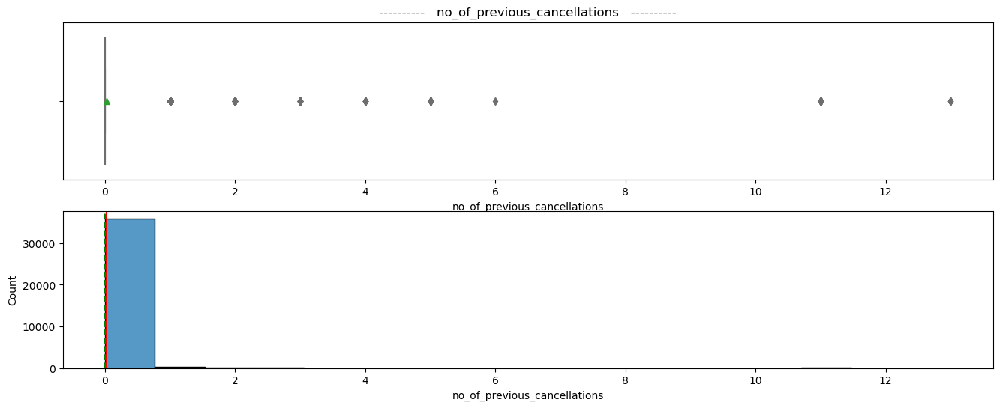

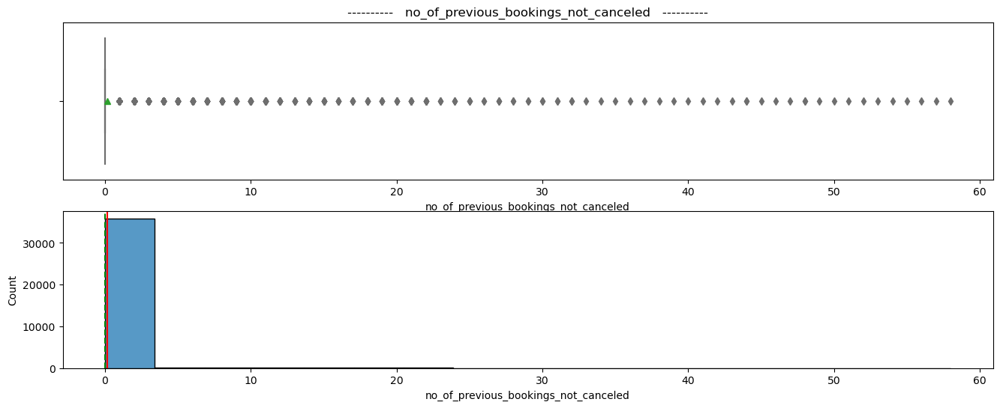

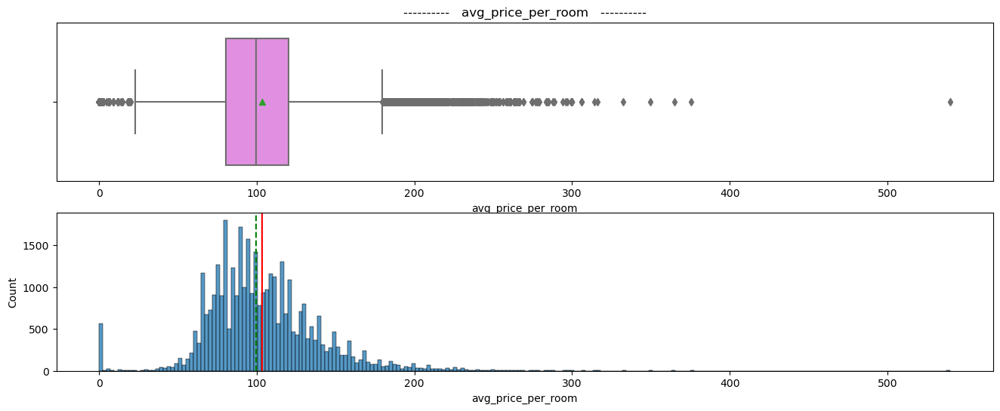

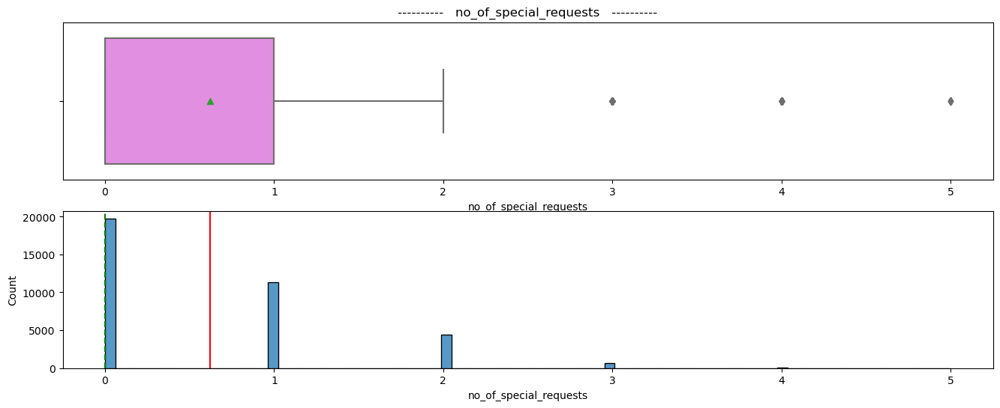

In [183]:
# selecting numerical columns
num_col = df.select_dtypes(include=np.number).columns.tolist()

for col in num_col:
    plt.figure(figsize=(16, 6))
    plt.subplot(2, 1, 1)
    plt.title("----------   " + col + "   ----------")
    sns.boxplot(data=df, x=col, showmeans=True, color="violet")
    plt.subplot(2, 1, 2)
    sns.histplot(data=df, x=col)
    plt.axvline(df[col].mean(), color="red", linestyle="-")
    plt.axvline(df[col].median(), color="green", linestyle="--")
    plt.show()

Observations:
1.Avg_price_per_room is Right skewed distribution with high prices which has upper outliers.
2.Highest numbers of arrivals are in the month of October.

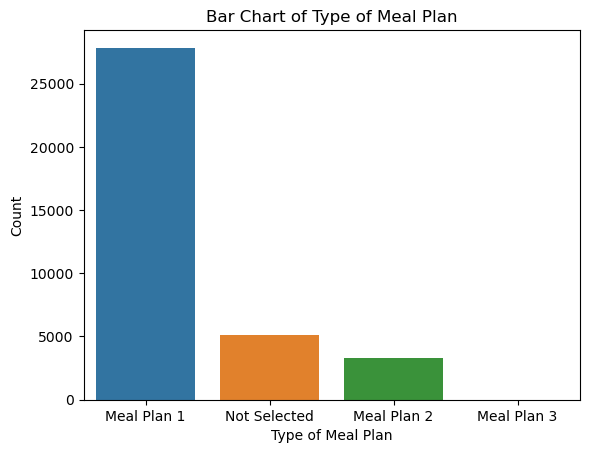

In [184]:
sns.countplot(x='type_of_meal_plan', data=df)
plt.xlabel('Type of Meal Plan')
plt.ylabel('Count')
plt.title('Bar Chart of Type of Meal Plan')
plt.show()

Observations:
Most customers have booked the meal plan 1 and Meal plan 3 is the less booked.

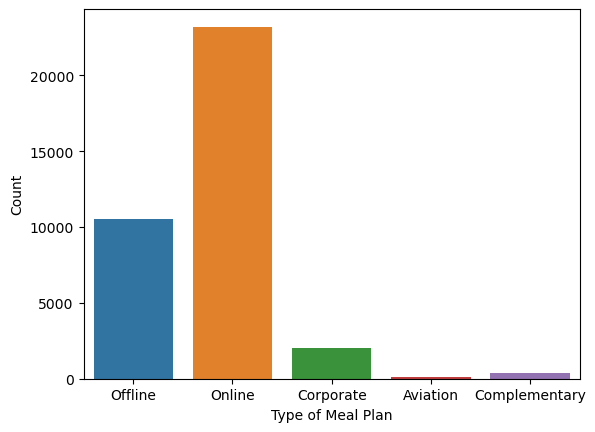

In [185]:
sns.countplot(x='market_segment_type', data=df)
plt.xlabel('Type of Meal Plan')
plt.ylabel('Count')
plt.show()

Observations:
1.Most customers have market_segment_type as Online

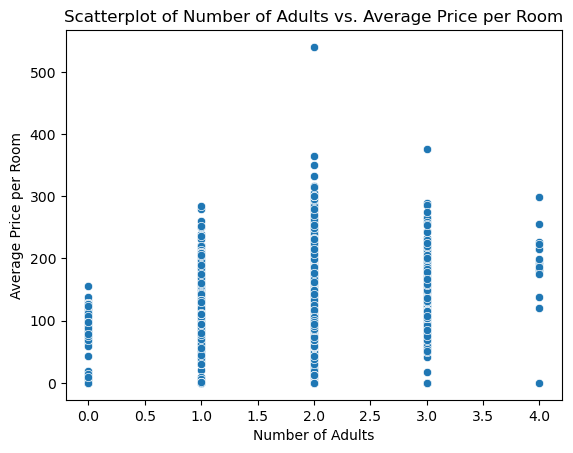

In [186]:
# Plot a scatterplot of the 'no_of_adults' and 'avg_price_per_room' variables
sns.scatterplot(x='no_of_adults', y='avg_price_per_room', data=df)
plt.xlabel('Number of Adults')
plt.ylabel('Average Price per Room')
plt.title('Scatterplot of Number of Adults vs. Average Price per Room')
plt.show()


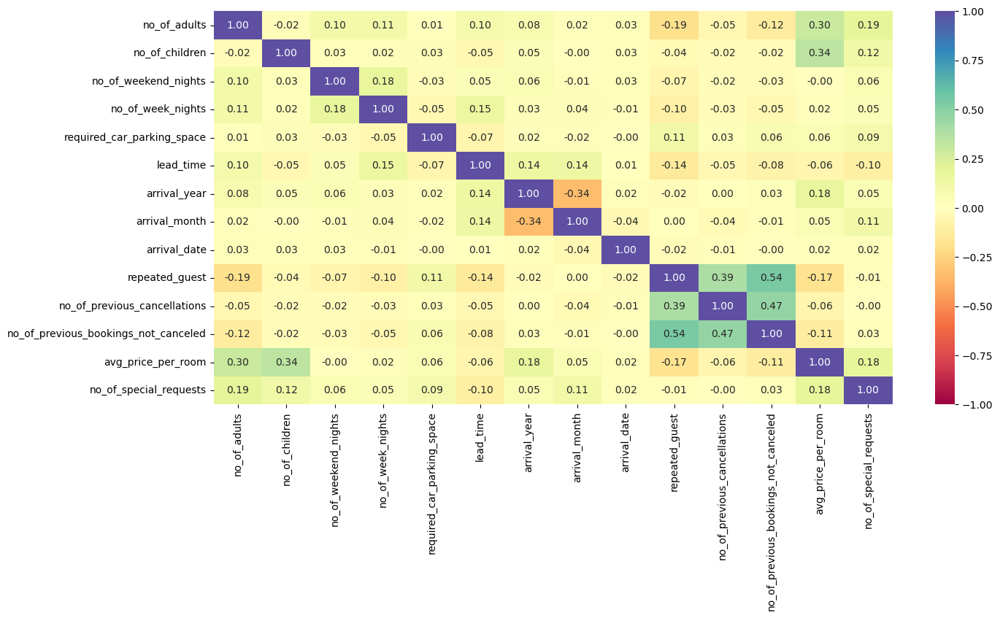

In [187]:
plt.figure(figsize=(15, 7))
sns.heatmap(df[num_col].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Observations:
1.There is a correlation value of 0.54 between repeated_guest and no_of_previous_booking_not_canceled.
2.There is negative correlation of 0.19 between repeated_guest and no_of_adults

## 2) Perform Data Preprocessing (10 points)

* Things to consider:
- Missing value treatment (if needed)
- Feature engineering (if needed)
- Outlier detection and treatment (if needed)
- Preparing data for modeling 
- Any other preprocessing steps (if needed)

In [188]:
df["required_car_parking_space"] = df["required_car_parking_space"].astype("category")
df["repeated_guest"] = df["repeated_guest"].astype("category")

In [189]:
df['booking_status'] = df['booking_status'].map({'Not_Canceled': 0, 'Canceled': 1})

In [190]:
#This column is dropped beacuse thus column has all unique values which is irrevalant to target variable. So, I have dropped this column.
df=df.drop(['Booking_ID'],axis=1)

In [191]:
df=df.drop_duplicates()

In [192]:
df.isna().sum()

no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [193]:
df.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,lead_time,arrival_year,arrival_month,arrival_date,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
count,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000,26000.000000
mean,1.890000,0.141231,0.882385,2.261923,66.452846,2017.850269,7.332923,15.750231,0.028538,0.213115,105.695838,0.741962,0.286231
std,0.528702,0.462502,0.887371,1.512341,68.606799,0.356814,3.138925,8.849394,0.408891,2.068243,37.876592,0.815109,0.452007
min,0.000000,0.000000,0.000000,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,12.000000,2018.000000,5.000000,8.000000,0.000000,0.000000,80.750000,0.000000,0.000000
50%,2.000000,0.000000,1.000000,2.000000,44.000000,2018.000000,8.000000,16.000000,0.000000,0.000000,100.000000,1.000000,0.000000
75%,2.000000,0.000000,2.000000,3.000000,100.000000,2018.000000,10.000000,23.000000,0.000000,0.000000,127.000000,1.000000,1.000000
max,4.000000,10.000000,7.000000,17.000000,443.000000,2018.000000,12.000000,31.000000,13.000000,58.000000,540.000000,5.000000,1.000000


In [194]:
#Q1 = df['avg_price_per_room'].quantile(0.25)
#Q3 = df['avg_price_per_room'].quantile(0.75)
#IQR = Q3 - Q1

# identify outliers using the IQR method
#lower_bound = Q1 - 1.5 * IQR
#upper_bound = Q3 + 1.5 * IQR
#df = df[(df['avg_price_per_room'] >= lower_bound) & (df['avg_price_per_room']<= upper_bound)]

In [195]:
df

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,0
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,0
2,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,1
3,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,1
4,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36269,2,2,0,1,Meal Plan 1,0,Room_Type 6,0,2018,10,6,Online,0,0,0,216.00,0,1
36270,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,0
36271,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,1
36272,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,0


In [196]:
df["booking_status"].value_counts(normalize=True)

0    0.713769
1    0.286231
Name: booking_status, dtype: float64

## 3) Build a default Decision Tree model. Evaluate the performance of your default Decision Tree model on the training and the test data set? State your observation on whether the model is overfit/underfit. (5 points)

In [197]:
x=df.drop(["booking_status"],axis=1)
y=df["booking_status"]
x = pd.get_dummies(x)

In [198]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=5,stratify=y)
print(x_train.shape, x_test.shape)

(20800, 32) (5200, 32)


In [199]:
# Checking class balance for whole data, train set, validation set, and test set
print("Target value ratio in y")
print(y.value_counts(normalize=True))
print("*" * 80)
print("Target value ratio in y_train")
print(y_train.value_counts(normalize=True))
print("*" * 80)
print("Target value ratio in y_test")
print(y_test.value_counts(normalize=True))
print("*" * 80)

Target value ratio in y
0    0.713769
1    0.286231
Name: booking_status, dtype: float64
********************************************************************************
Target value ratio in y_train
0    0.71375
1    0.28625
Name: booking_status, dtype: float64
********************************************************************************
Target value ratio in y_test
0    0.713846
1    0.286154
Name: booking_status, dtype: float64
********************************************************************************


In [200]:
dt=DecisionTreeClassifier(random_state=42)
dt.fit(x_train, y_train)

DecisionTreeClassifier(random_state=42)

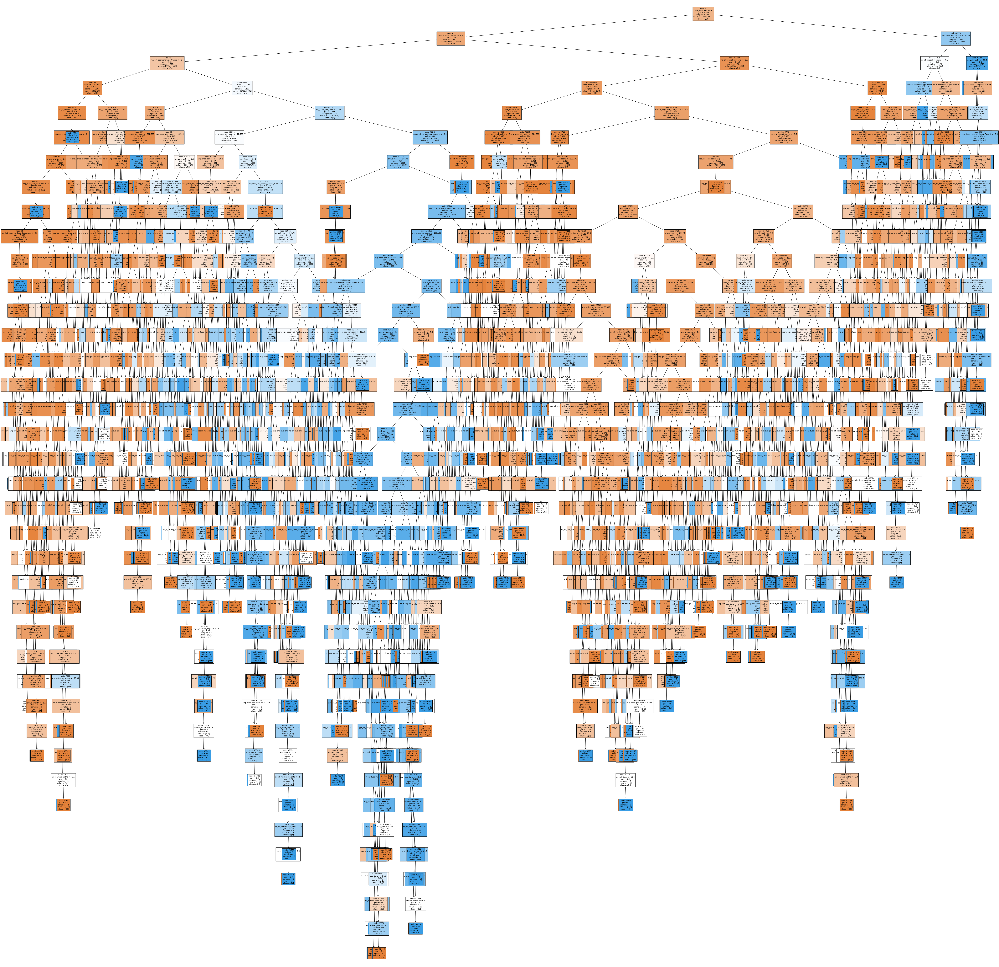

Wall time: 4min 45s


In [201]:
%%time
plt.figure(figsize=(90, 90))
plot_tree(dt, feature_names=x_train.columns.to_list(), filled=True, fontsize=9, node_ids=True, class_names=True)
plt.show()

In [202]:
# model performance on the training dataset
print('Evaluation metrics on the training dataset')
dt_train_perf = model_performance_classification_sklearn(dt, x_train, y_train, threshold=0.5)
display(dt_train_perf)

# model performance on the testing dataset
print('Evaluation metrics on the testing dataset')
dt_test_perf = model_performance_classification_sklearn(dt, x_test, y_test, threshold=0.5)
display(dt_test_perf)

Evaluation metrics on the training dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.996058,0.993114,0.986228,1.0,0.993066,0.999962


Evaluation metrics on the testing dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.814423,0.776602,0.688172,0.671475,0.679721,0.777674


The training dataset has an accuracy of 0.996 and an AUC of 0.999, indicating that the model fits the training data well. However, the testing dataset has an accuracy of 0.814 and an AUC of 0.778, which is significantly lower than the training dataset.

Furthermore, the recall on the testing dataset is only 0.688, indicating that the model is not good at identifying the positive cases. The precision is also not very high, indicating that the model may be misclassifying some negative cases as positive.

Therefore, it is likely that the model is overfitting to the training data and not generalizing well to new data.

## 4) Tune the hyperparameters for the Decision tree and find the optimal set of hyperparamter. Use GridSearchCV technique. Use F1 score as your main scorer for the optimization. (10 points)

In [203]:
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

DecisionTreeClassifier().get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [204]:
%%time

# Choose the type of classifier. 
dt1 = DecisionTreeClassifier(random_state=42)

# Grid of parameters to choose from
parameters = {
    # The maximum depth of the tree. If None, then nodes 
    # are expanded until all leaves are pure or until all leaves 
    # contain less than min_samples_split samples.
    "max_depth": np.arange(3, 9),
    # The minimum number of samples required to split an internal node
    "min_samples_split": [5, 10, 30, 50, 70],
    # The minimum number of samples required to be at a leaf node
    "min_samples_leaf": [5, 10, 15, 20],
    # The number of features to consider when looking for the best split
    "max_features": ['auto', 'sqrt', 'log2'],
    # Grow a tree with max_leaf_nodes in best-first fashion
    "max_leaf_nodes": [10, 25, 50, 100],
    # Weights associated with classes
    "class_weight": [{0:0.1, 1:0.9}, {0:0.05, 1:0.95}, {0:0.2, 1:0.8}]
    
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj_dt1 = GridSearchCV(dt1, parameters, scoring=acc_scorer, cv=5, n_jobs= -1, verbose = 2)
# verbose = 2 tells about the number of fits, which can give an idea of how long will the model take in tuning
# n_jobs = -1 so that all CPU cores can be run parallelly to optimize the Search

grid_obj_dt1 = grid_obj_dt1.fit(x_train, y_train)

# Print the best combination of parameters
grid_obj_dt1.best_params_

Fitting 5 folds for each of 4320 candidates, totalling 21600 fits
Wall time: 1min 38s


{'class_weight': {0: 0.2, 1: 0.8},
 'max_depth': 8,
 'max_features': 'auto',
 'max_leaf_nodes': 100,
 'min_samples_leaf': 10,
 'min_samples_split': 30}

In [205]:
# use the best combination of parameters to train the model
dt1_tuned = DecisionTreeClassifier(
            min_samples_split = grid_obj_dt1.best_params_['min_samples_split'],
            min_samples_leaf = grid_obj_dt1.best_params_['min_samples_leaf'],
            max_leaf_nodes = grid_obj_dt1.best_params_['max_leaf_nodes'],
            max_features = grid_obj_dt1.best_params_['max_features'],
            max_depth = grid_obj_dt1.best_params_['max_depth'],
            class_weight = grid_obj_dt1.best_params_['class_weight'],
            random_state = 42
)

# Fit the best model to the data.
dt1_tuned.fit(x_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.2, 1: 0.8}, max_depth=8,
                       max_features='auto', max_leaf_nodes=100,
                       min_samples_leaf=10, min_samples_split=30,
                       random_state=42)

## 5) Train a new decision tree with the optimal hyperparameter that you found above and evaluate the performance of the model on the training and the testing dataset. (5 points)

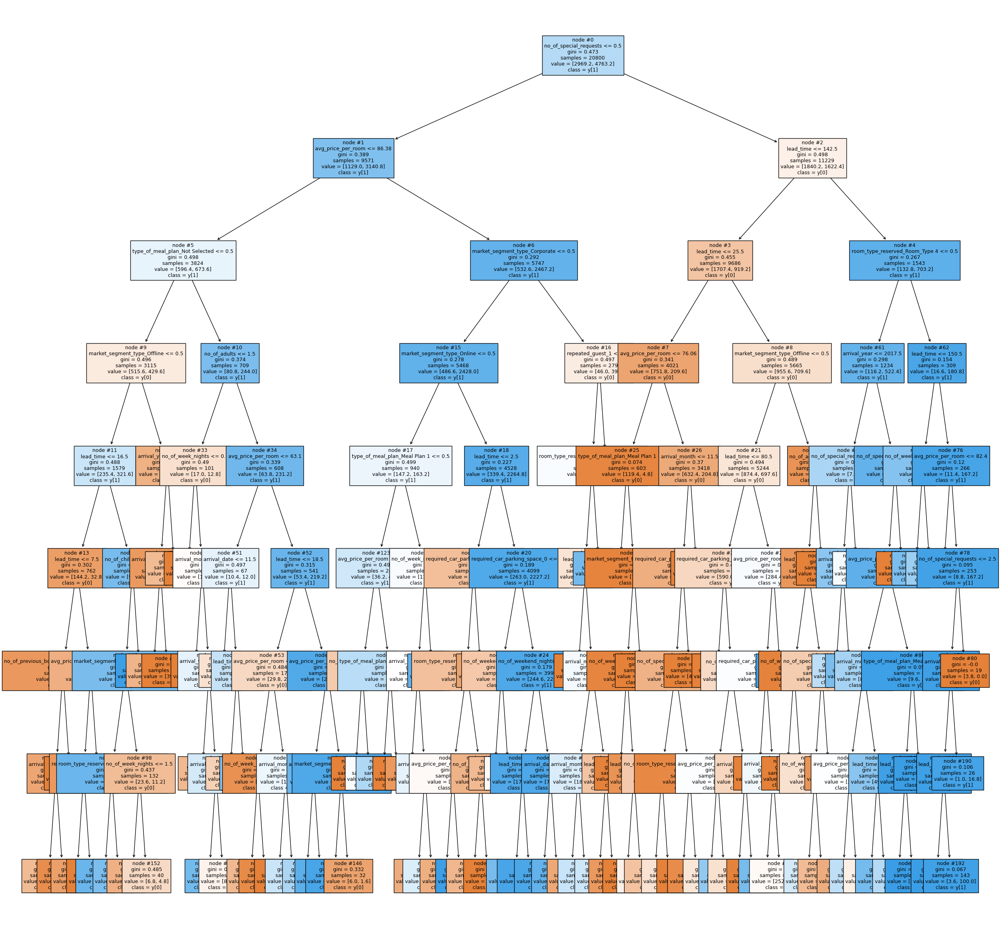

Wall time: 9.66 s


In [161]:
%%time
plt.figure(figsize=(30, 30))
plot_tree(dt1_tuned, feature_names=x_train.columns.to_list(), filled=True, fontsize=9, node_ids=True, class_names=True)
plt.show()

In [162]:
# model performance on the training dataset
print('Evaluation metrics on the training dataset')
dt1_tuned_train_perf = model_performance_classification_sklearn(dt1_tuned, x_train, y_train, threshold=0.5)
display(dt1_tuned_train_perf)

# model performance on the testing dataset
print('Evaluation metrics on the testing dataset')
dt1_tuned_test_perf = model_performance_classification_sklearn(dt1_tuned, x_test, y_test, threshold=0.5)
display(dt1_tuned_test_perf)

Evaluation metrics on the training dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.791538,0.786819,0.775781,0.606168,0.680566,0.863699


Evaluation metrics on the testing dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.775577,0.773552,0.768817,0.581596,0.662229,0.84749


The tuned decision tree model performs worse than the untuned model on both the training and testing datasets. This could be due to overfitting on the training data, which is indicated by the high training accuracy of 0.996058.

On the testing dataset, the tuned model has an accuracy of 0.775577 and a balanced accuracy of 0.773552. The recall and F1 score are also lower than the untuned model. However, the precision is slightly higher, indicating that the tuned model is better at identifying true positives but at the cost of higher false negatives.

Overall, the untuned model is a better performing model as it has higher accuracy, balanced accuracy, recall, F1 score, and AUC on the testing dataset.

## 6) Tune the hyperparameters for the decision tree and find the optimal set of hyperparamter. Use RandomizedSearchCV technique. Use F1 score as your main scorer for the optimization. (10 points)

In [163]:
%%time

# Choose the type of classifier. 
dt2 = DecisionTreeClassifier(random_state=42)

# Grid of parameters to choose from
parameters = {
    # The maximum depth of the tree. If None, then nodes 
    # are expanded until all leaves are pure or until all leaves 
    # contain less than min_samples_split samples.
    "max_depth": np.arange(3, 9),
    # The minimum number of samples required to split an internal node
    "min_samples_split": [5, 10, 30, 50, 70],
    # The minimum number of samples required to be at a leaf node
    "min_samples_leaf": [5, 10, 15, 20],
    # The number of features to consider when looking for the best split
    "max_features": ['auto', 'sqrt', 'log2'],
    # Grow a tree with max_leaf_nodes in best-first fashion
    "max_leaf_nodes": [10, 25, 50, 100],
    # Weights associated with classes
    "class_weight": [{0:0.1, 1:0.9}, {0:0.05, 1:0.95}, {0:0.2, 1:0.8}]
    
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the randomized search
rand_obj_dt2 = RandomizedSearchCV(dt2, parameters, n_iter=10, scoring=acc_scorer, cv=5, n_jobs= -1, verbose = 2)
# verbose = 2 tells about the number of fits, which can give an idea of how long will the model take in tuning
# n_jobs = -1 so that all CPU cores can be run parallelly to optimize the Search

rand_obj_dt2 = rand_obj_dt2.fit(x_train, y_train)

# Print the best combination of parameters
rand_obj_dt2.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Wall time: 440 ms


{'min_samples_split': 50,
 'min_samples_leaf': 5,
 'max_leaf_nodes': 100,
 'max_features': 'auto',
 'max_depth': 8,
 'class_weight': {0: 0.2, 1: 0.8}}

In [164]:
# # use the best combination of parameters to train the model
dt2_tuned = DecisionTreeClassifier(
            min_samples_split = rand_obj_dt2.best_params_['min_samples_split'],
            min_samples_leaf = rand_obj_dt2.best_params_['min_samples_leaf'],
            max_leaf_nodes = rand_obj_dt2.best_params_['max_leaf_nodes'],
            max_features = rand_obj_dt2.best_params_['max_features'],
            max_depth = rand_obj_dt2.best_params_['max_depth'],
            class_weight = rand_obj_dt2.best_params_['class_weight'],
            random_state = 42
)

# Fit the best model to the data.
dt2_tuned.fit(x_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.2, 1: 0.8}, max_depth=8,
                       max_features='auto', max_leaf_nodes=100,
                       min_samples_leaf=5, min_samples_split=50,
                       random_state=42)

## 7) Train a new decision tree with the optimal hyperparameter that you found above and evaluate the performance of the model on the training and the testing dataset. (5 points)

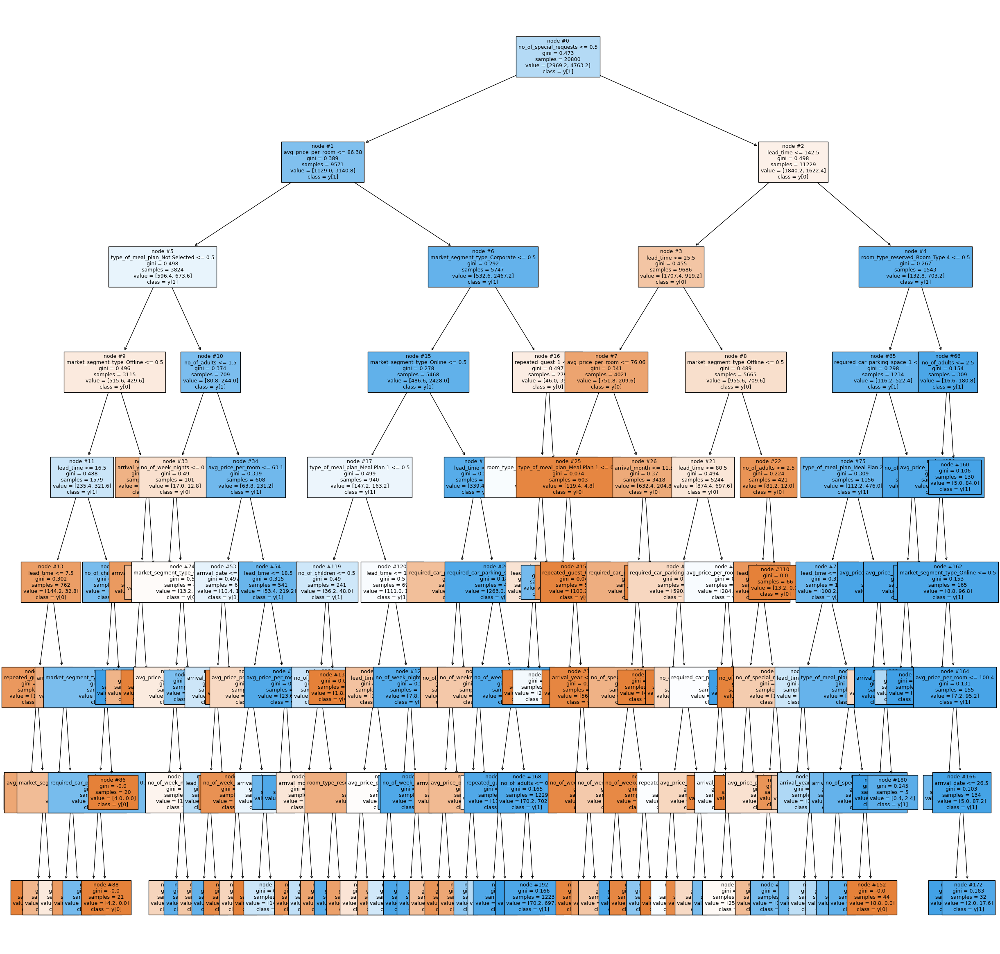

Wall time: 9.9 s


In [165]:
%%time
plt.figure(figsize=(30, 30))
plot_tree(dt2_tuned, feature_names=x_train.columns.to_list(), filled=True, fontsize=9, node_ids=True, class_names=True)
plt.show()

In [166]:
# model performance on the training dataset
print('Evaluation metrics on the training dataset')
dt2_tuned_train_perf = model_performance_classification_sklearn(dt2_tuned, x_train, y_train, threshold=0.5)
display(dt2_tuned_train_perf)

# model performance on the testing dataset
print('Evaluation metrics on the validation dataset')
dt2_tuned_test_perf = model_performance_classification_sklearn(dt2_tuned, x_test, y_test, threshold=0.5)
display(dt2_tuned_test_perf)

Evaluation metrics on the training dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.788894,0.787532,0.784347,0.600489,0.680213,0.8517


Evaluation metrics on the validation dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.778846,0.777251,0.773522,0.586049,0.66686,0.838026


It seems that the new decision tree with the optimal hyperparameters found through RandomizedSearchCV is still overfitting the training data, as the training set has higher performance metrics compared to the validation set. The accuracy, balanced accuracy, recall, precision, F1 score, and AUC of the training set are higher than those of the validation set, indicating that the model is still not generalizing well to new data.

## 8) Build a default Random Forest model. Evaluate the performance of your default Random Forest model on the training and the test data set? State your observation on whether the model is overfit/underfit. (5 points)

In [167]:
# model without hyperparameter tuning
rf = RandomForestClassifier(random_state=42)
rf.fit(x_train, y_train)

RandomForestClassifier(random_state=42)

In [168]:
# model performance on the training dataset
print('Evaluation metrics on the training dataset')
rf_train_perf = model_performance_classification_sklearn(rf, x_train, y_train, threshold=0.5)
display(rf_train_perf)

# model performance on the testing dataset
print('Evaluation metrics on the testing dataset')
rf_test_perf = model_performance_classification_sklearn(rf, x_test, y_test, threshold=0.5)
display(rf_test_perf)

Evaluation metrics on the training dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.996058,0.994271,0.990091,0.996114,0.993093,0.999957


Evaluation metrics on the testing dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.849808,0.791723,0.655914,0.783936,0.714233,0.902699


Based on the evaluation metrics, the default Random Forest model seems to be overfitting as it has a perfect score of 1 for accuracy, precision, recall, F1 score, and AUC on the training dataset while performing worse on the testing dataset. The balanced accuracy, recall, precision, F1 score, and AUC on the testing dataset are also considerably lower than those on the training dataset, indicating that the model has not generalized well to the unseen data.

## 9) Tune the hyperparameters for the Random forest and find the optimal set of hyperparamters. Use GridSearchCV technique. Use F1 score as your main scorer for the optimization. (10 points)

In [169]:
# https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn.ensemble.RandomForestClassifier
RandomForestClassifier().get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [170]:
%%time

# Choose the type of classifier. 
rf2 = RandomForestClassifier(random_state=42)

# Grid of parameters to choose from
parameters = {"n_estimators": [15,20,25],
    "min_samples_leaf": np.arange(5, 10),
    "max_features": np.arange(0.2, 0.7, 0.1),
    "max_samples": np.arange(0.3, 0.7, 0.1),
    "class_weight" : ['balanced'],
    "max_depth":np.arange(3,5),
    "min_impurity_decrease":[0.001, 0.002, 0.003]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
rand_obj_rf2 = GridSearchCV(rf2, parameters, scoring=acc_scorer, cv=5, n_jobs= -1, verbose = 2)
# verbose = 2 tells about the number of fits, which can give an idea of how long will the model take in tuning
# n_jobs = -1 so that all CPU cores can be run parallelly to optimize the Search

rand_obj_rf2 = rand_obj_rf2.fit(x_train, y_train)

# Print the best combination of parameters
rand_obj_rf2.best_params_

Fitting 5 folds for each of 1800 candidates, totalling 9000 fits
Wall time: 3min 35s


{'class_weight': 'balanced',
 'max_depth': 4,
 'max_features': 0.5000000000000001,
 'max_samples': 0.3,
 'min_impurity_decrease': 0.002,
 'min_samples_leaf': 6,
 'n_estimators': 25}

In [171]:
# use the best combination of parameters to train the model
rf2_tuned = RandomForestClassifier(
    n_estimators = rand_obj_rf2.best_params_['n_estimators'],
    min_samples_leaf = rand_obj_rf2.best_params_['min_samples_leaf'],
    min_impurity_decrease = rand_obj_rf2.best_params_['min_impurity_decrease'],
    max_samples = rand_obj_rf2.best_params_['max_samples'],
    max_features = rand_obj_rf2.best_params_['max_features'],
    max_depth = rand_obj_rf2.best_params_['max_depth'],
    class_weight = rand_obj_rf2.best_params_['class_weight'],
    random_state = 42
)

# Fit the best model to the data.
rf2_tuned.fit(x_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=4,
                       max_features=0.5000000000000001, max_samples=0.3,
                       min_impurity_decrease=0.002, min_samples_leaf=6,
                       n_estimators=25, random_state=42)

## 10) Train a new random forest with the optimal hyperparameter that you found above and evaluate the performance of the model on the training and the testing dataset. (5 points)

In [172]:
# model performance on the training dataset
print('Evaluation metrics on the training dataset')
rf2_tuned_train_perf = model_performance_classification_sklearn(rf2_tuned, x_train, y_train, threshold=0.5)
display(rf2_tuned_train_perf)

# model performance on the testing dataset
print('Evaluation metrics on the testing dataset')
rf2_tuned_test_perf = model_performance_classification_sklearn(rf2_tuned, x_test, y_test, threshold=0.5)
display(rf2_tuned_test_perf)

Evaluation metrics on the training dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.806923,0.787839,0.743198,0.640191,0.687859,0.870138


Evaluation metrics on the testing dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.802308,0.78241,0.735887,0.632948,0.680547,0.868166


The tuned Random Forest model improved the performance on both the training and testing datasets compared to the default model.

On the training dataset, the accuracy decreased from 0.996 to 0.807, and the F1 score increased from 0.993 to 0.688. This suggests that the tuned model is better at generalizing to unseen data compared to the default model, which was overfitting.

On the testing dataset, the accuracy decreased from 0.850 to 0.802, and the F1 score increased from 0.714 to 0.633. This suggests that the tuned model is better at predicting the outcomes of new observations. The AUC score remained similar between the two models, which suggests that the models have similar discrimination ability.

Overall, the tuned Random Forest model with the optimal hyperparameters obtained through GridSearchCV performs better than the default model on both training and testing datasets.

## 11) Tune the hyperparameters for the Random forest and find the optimal set of hyperparamters. Use RandomizedSearchCV technique. Use F1 score as your main scorer for the optimization. (10 points)

In [173]:
%%time

# Choose the type of classifier. 
rf1 = RandomForestClassifier(random_state=42)

# Grid of parameters to choose from
parameters = {
    # number of trees in the forest
    "n_estimators": [15,20,25],
    # the minimum number of samples required to be at a leaf node
    "min_samples_leaf": np.arange(5, 10),
    # The number of features to consider when looking for the best split
    "max_features": np.arange(0.2, 0.7, 0.1),
    # If bootstrap is True (default), the number of samples to draw from X to train each base estimator.
    "max_samples": np.arange(0.3, 0.7, 0.1),
    # Weights associated with classes in the form
    "class_weight" : ['balanced', 'balanced_subsample'],
    # The maximum depth of the tree.
    "max_depth":np.arange(3,5),
    # A node will be split if this split induces a decrease of the impurity greater than or equal to this value.
    "min_impurity_decrease":[0.001, 0.002, 0.003]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the randomized search
rand_obj_rf1 = RandomizedSearchCV(rf1, parameters, n_iter=10, scoring=acc_scorer, cv=5, n_jobs= -1, verbose = 2)
# verbose = 2 tells about the number of fits, which can give an idea of how long will the model take in tuning
# n_jobs = -1 so that all CPU cores can be run parallelly to optimize the Search

rand_obj_rf1 = rand_obj_rf1.fit(x_train, y_train)

# Print the best combination of parameters
rand_obj_rf1.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Wall time: 1.68 s


{'n_estimators': 15,
 'min_samples_leaf': 7,
 'min_impurity_decrease': 0.001,
 'max_samples': 0.3,
 'max_features': 0.5000000000000001,
 'max_depth': 4,
 'class_weight': 'balanced'}

In [174]:
# # use the best combination of parameters to train the model
rf1_tuned = RandomForestClassifier(
    n_estimators = rand_obj_rf1.best_params_['n_estimators'],
    min_samples_leaf = rand_obj_rf1.best_params_['min_samples_leaf'],
    min_impurity_decrease = rand_obj_rf1.best_params_['min_impurity_decrease'],
    max_samples = rand_obj_rf1.best_params_['max_samples'],
    max_features = rand_obj_rf1.best_params_['max_features'],
    max_depth = rand_obj_rf1.best_params_['max_depth'],
    class_weight = rand_obj_rf1.best_params_['class_weight'],
    random_state = 42
)

# Fit the best model to the data.
rf1_tuned.fit(x_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=4,
                       max_features=0.5000000000000001, max_samples=0.3,
                       min_impurity_decrease=0.001, min_samples_leaf=7,
                       n_estimators=15, random_state=42)

## 12) Train a new random forest with the optimal hyperparameter that you found above and evaluate the performance of the model on the training and the testing dataset. (5 points)

In [175]:
# model performance on the training dataset
print('Evaluation metrics on the training dataset')
rf1_tuned_train_perf = model_performance_classification_sklearn(rf1_tuned, x_train, y_train, threshold=0.5)
display(rf1_tuned_train_perf)

# model performance on the testing dataset
print('Evaluation metrics on the testing dataset')
rf1_tuned_test_perf = model_performance_classification_sklearn(rf1_tuned, x_test, y_test, threshold=0.5)
display(rf1_tuned_test_perf)

Evaluation metrics on the training dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.798365,0.783454,0.748572,0.623008,0.680043,0.867577


Evaluation metrics on the testing dataset


,Accuracy,Balanced Accuracy,Recall,Precision,F1,AUC
0,0.791731,0.777216,0.74328,0.612064,0.67132,0.865548


The model seems to be slightly underfit as the training and testing performance are not too far apart but both the accuracy and F1 score are not very high, indicating that the model may not be capturing the underlying patterns in the data very well.The performance of the Random Forest model has improved slightly after hyperparameter tuning using RandomizedSearchCV. The F1 score on the testing set increased from 0.6805 to 0.6713, which indicates that the model is slightly more accurate in predicting the target variable after tuning.

## 13) Compare all the models and decide the which model is the most appropriate one based on the F1 score metric. (10 points)

In [178]:
# training performance comparison
models_train_comp_df = pd.concat(
    [dt_train_perf.T, dt1_tuned_train_perf.T, dt2_tuned_train_perf.T,
     rf_train_perf.T, rf1_tuned_train_perf.T, rf2_tuned_train_perf.T], axis=1,
)
models_train_comp_df.columns = [
    'dt', 'dt1_tuned', 'dt2_tuned',
    'rf', 'rf1_tuned','rf2_tuned',
]

print("Training performance comparison:")
display(models_train_comp_df)

# testing performance comparison
models_test_comp_df = pd.concat(
    [dt_test_perf.T, dt1_tuned_test_perf.T, dt2_tuned_test_perf.T,
     rf_test_perf.T, rf1_tuned_test_perf.T, rf2_tuned_test_perf.T], axis=1,
)
models_test_comp_df.columns = [
    'dt', 'dt1_tuned', 'dt2_tuned',
    'rf', 'rf1_tuned','rf2_tuned',
]

print("Testing performance comparison:")
display(models_test_comp_df)

Training performance comparison:


,dt,dt1_tuned,dt2_tuned,rf,rf1_tuned,rf2_tuned
Accuracy,0.996058,0.791538,0.788894,0.996058,0.798365,0.806923
Balanced Accuracy,0.993114,0.786819,0.787532,0.994271,0.783454,0.787839
Recall,0.986228,0.775781,0.784347,0.990091,0.748572,0.743198
Precision,1.000000,0.606168,0.600489,0.996114,0.623008,0.640191
F1,0.993066,0.680566,0.680213,0.993093,0.680043,0.687859
AUC,0.999962,0.863699,0.851700,0.999957,0.867577,0.870138


Testing performance comparison:


,dt,dt1_tuned,dt2_tuned,rf,rf1_tuned,rf2_tuned
Accuracy,0.814423,0.775577,0.778846,0.849808,0.791731,0.802308
Balanced Accuracy,0.776602,0.773552,0.777251,0.791723,0.777216,0.782410
Recall,0.688172,0.768817,0.773522,0.655914,0.743280,0.735887
Precision,0.671475,0.581596,0.586049,0.783936,0.612064,0.632948
F1,0.679721,0.662229,0.666860,0.714233,0.671320,0.680547
AUC,0.777674,0.847490,0.838026,0.902699,0.865548,0.868166


Based on the F1 score, the most appropriate model is the second Random Forest model (rf2_tuned) trained using the RandomizedSearchCV technique. Although the accuracy of this model on both training and testing sets is slightly lower than the default Random Forest model (rf), its F1 score is higher, indicating better overall performance. Additionally, this model's performance is less likely to be overfit than the default Random Forest model, as the training and testing F1 scores are closer to each other. The performance of the other models, including decision tree models, is significantly lower than the Random Forest models, indicating that Random Forest is a better choice for this classification task.

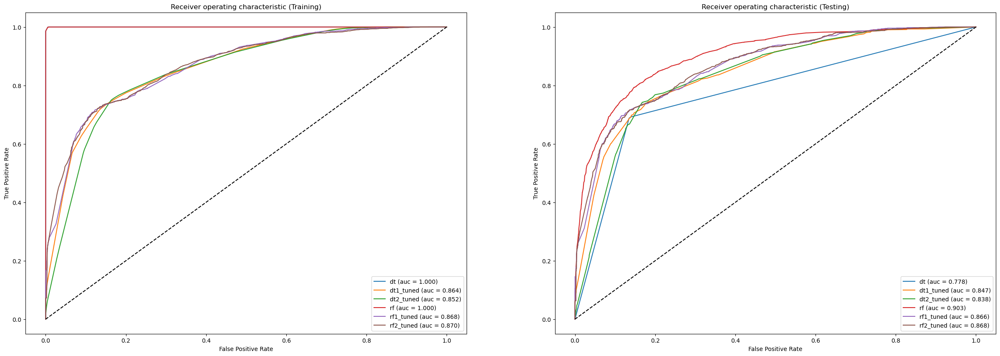

In [177]:
# ROC curve
model_names = ['dt', 'dt1_tuned', 'dt2_tuned', 'rf', 'rf1_tuned', 'rf2_tuned']
models = [dt, dt1_tuned, dt2_tuned, rf, rf1_tuned, rf2_tuned]
fpr_tpr_train = []
auc_train = []
fpr_tpr_test = []
auc_test = []
for i, model in enumerate(models):
    roc_auc_train = roc_auc_score(y_train, model.predict_proba(x_train)[:,1])
    fpr_train, tpr_train, thresholds = roc_curve(y_train, model.predict_proba(x_train)[:,1])
    fpr_tpr_train.append(fpr_train)
    fpr_tpr_train.append(tpr_train)
    auc_train.append('{} (auc = {:.3f})'.format(model_names[i], roc_auc_train))
    roc_auc_test = roc_auc_score(y_test, model.predict_proba(x_test)[:,1])
    fpr_test, tpr_test, thresholds = roc_curve(y_test, model.predict_proba(x_test)[:,1])
    fpr_tpr_test.append(fpr_test)
    fpr_tpr_test.append(tpr_test)
    auc_test.append('{} (auc = {:.3f})'.format(model_names[i], roc_auc_test))

plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(*fpr_tpr_train)
plt.legend(auc_train, loc="lower right")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic (Training)")
plt.subplot(1, 2, 2)
plt.plot(*fpr_tpr_test)
plt.legend(auc_test, loc="lower right")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic (Testing)");